# Part 1

#Import the data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
signal = pd.read_csv("Part- 1 - Signal.csv",sep=",")
print(signal.shape)
signal.head()

(1599, 12)


,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11,Signal_Strength
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [3]:
signal.dtypes

Parameter 1        float64
Parameter 2        float64
Parameter 3        float64
Parameter 4        float64
Parameter 5        float64
Parameter 6        float64
Parameter 7        float64
Parameter 8        float64
Parameter 9        float64
Parameter 10       float64
Parameter 11       float64
Signal_Strength      int64
dtype: object

#Data analysis & visualisation

In [4]:
import plotly.graph_objects as go
import plotly.express as px

In [5]:
signal = signal.replace(np.NaN, 0)
print(signal.isnull().sum())

Parameter 1        0
Parameter 2        0
Parameter 3        0
Parameter 4        0
Parameter 5        0
Parameter 6        0
Parameter 7        0
Parameter 8        0
Parameter 9        0
Parameter 10       0
Parameter 11       0
Signal_Strength    0
dtype: int64


In [6]:
signal.describe().T.style.bar(
    subset=['mean'],
    color='Reds').background_gradient(
    subset=['std'], cmap='ocean').background_gradient(subset=['50%'], cmap='PuBu')

,count,mean,std,min,25%,50%,75%,max
Parameter 1,1599.000000,8.319637,1.741096,4.600000,7.100000,7.900000,9.200000,15.900000
Parameter 2,1599.000000,0.527821,0.179060,0.120000,0.390000,0.520000,0.640000,1.580000
Parameter 3,1599.000000,0.270976,0.194801,0.000000,0.090000,0.260000,0.420000,1.000000
Parameter 4,1599.000000,2.538806,1.409928,0.900000,1.900000,2.200000,2.600000,15.500000
Parameter 5,1599.000000,0.087467,0.047065,0.012000,0.070000,0.079000,0.090000,0.611000
Parameter 6,1599.000000,15.874922,10.460157,1.000000,7.000000,14.000000,21.000000,72.000000
Parameter 7,1599.000000,46.467792,32.895324,6.000000,22.000000,38.000000,62.000000,289.000000
Parameter 8,1599.000000,0.996747,0.001887,0.990070,0.995600,0.996750,0.997835,1.003690
Parameter 9,1599.000000,3.311113,0.154386,2.740000,3.210000,3.310000,3.400000,4.010000
Parameter 10,1599.000000,0.658149,0.169507,0.330000,0.550000,0.620000,0.730000,2.000000


In [7]:
signal1 = signal.copy()

In [8]:
for col_name in signal1.drop(columns = 'Signal_Strength').columns:
    q1 = signal1[col_name].quantile(0.25)
    q3 = signal1[col_name].quantile(0.75)
    iqr = q3 - q1
    
    low = q1 - 1.5 * iqr
    high = q3 + 1.5 * iqr
    
    signal1.loc[(signal1[col_name] < low) | (signal1[col_name] > high), col_name] = signal1[col_name].median()

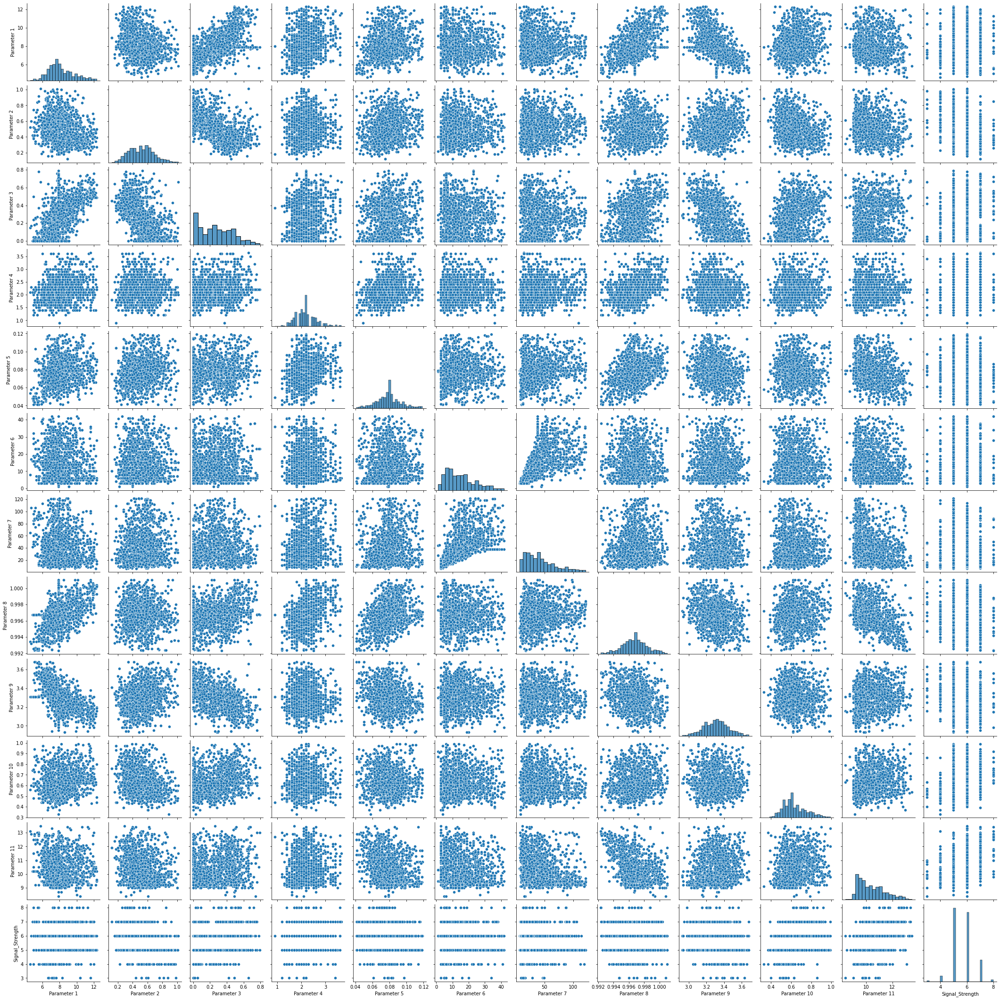

In [9]:
sns.pairplot(signal1)

<AxesSubplot:>

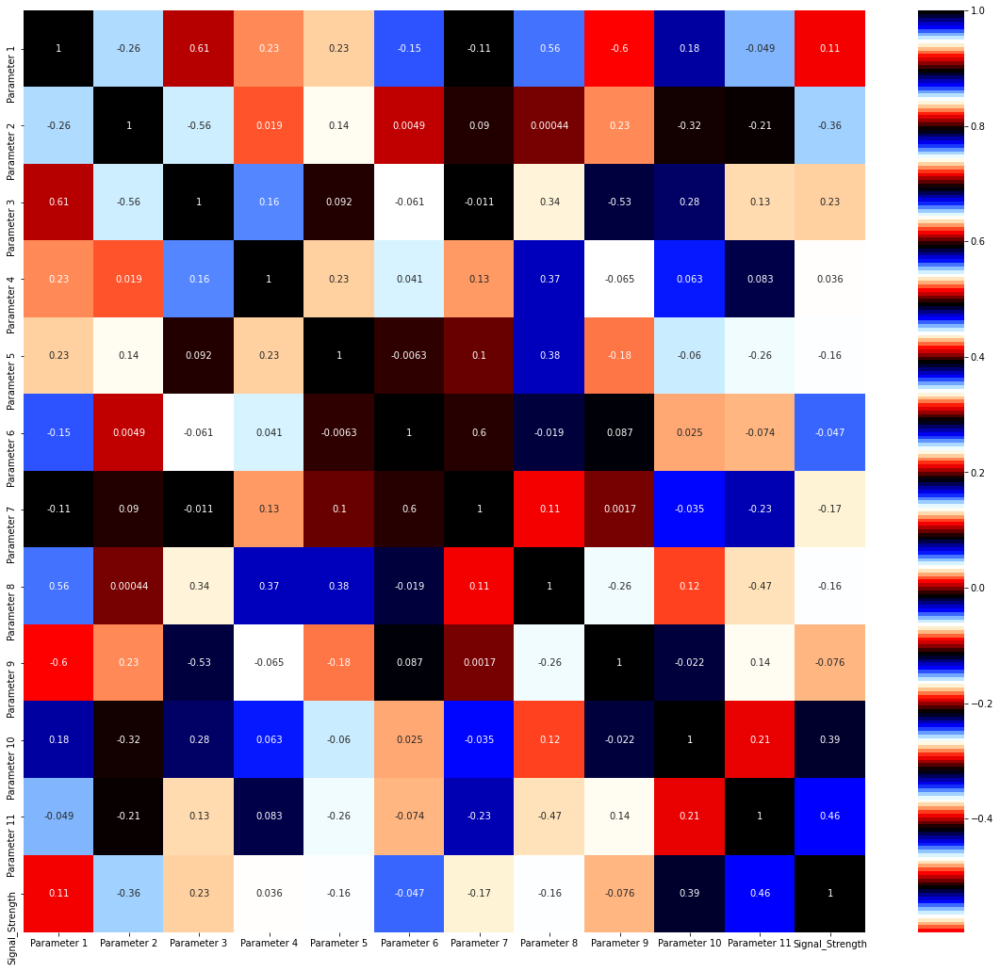

In [10]:
plt.figure(figsize=(20,18))

sns.heatmap(signal1.corr(), annot=True, cmap="flag")

In [11]:
def boxhistplot(columns,data):
    fig = px.histogram(signal1, x = signal1[column], color = 'Signal_Strength')
    fig.show()
    fig2 = px.box(signal1, x = signal1[column], color = 'Signal_Strength')
    fig2.show()
col = ['Parameter 1','Parameter 2','Parameter 3','Parameter 4','Parameter 5','Parameter 6','Parameter 7','Parameter 8','Parameter 9','Parameter 10','Parameter 11']
for column in col:
    boxhistplot(column, signal1)

In [12]:
import plotly.express as px
fig = px.scatter_matrix(signal1)
fig.update_layout(
    title='Signal Data set',
    width=1700,
    height=1550,
)
fig.show()

In [13]:
import plotly.express as px
fig = px.ecdf(signal1, x="Signal_Strength")
fig.show()

In [14]:
fig = px.strip(signal1, x="Signal_Strength", y="Parameter 7")
fig.show()

In [15]:
fig = px.strip(signal1, x="Signal_Strength", y="Parameter 8")
fig.show()

In [16]:
fig = px.strip(signal1, x="Signal_Strength", y="Parameter 6")
fig.show()

In [17]:
fig = px.parallel_categories(signal1)
fig.show()

In [18]:
fig = px.violin(signal1, y="Signal_Strength")
fig.show()

#Neural network regressor

#Using h20

In [19]:
signal1.to_csv('signal1.csv', index=False)

In [20]:
import h2o
h2o.init(max_mem_size = 2)
h2o.remove_all() 
from h2o.estimators.deeplearning import H2OAutoEncoderEstimator, H2ODeepLearningEstimator

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O_cluster_uptime:,4 hours 6 mins
H2O_cluster_timezone:,Asia/Kolkata
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.34.0.3
H2O_cluster_version_age:,4 months and 17 days !!!
H2O_cluster_name:,H2O_from_python_Admin_v474ze
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,1.569 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


In [21]:
%matplotlib inline                         
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from h2o.estimators.deeplearning import H2OAutoEncoderEstimator, H2ODeepLearningEstimator
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
from h2o.estimators.random_forest import H2ORandomForestEstimator

In [22]:
help(h2o)
from h2o.estimators.deeplearning import H2OAutoEncoderEstimator, H2ODeepLearningEstimator
help(H2ODeepLearningEstimator)
help(h2o.import_file)

Help on package h2o:

NAME
    h2o - :mod:`h2o` -- module for using H2O services.

PACKAGE CONTENTS
    assembly
    astfun
    auth
    automl (package)
    backend (package)
    base
    cross_validation
    demos
    display
    estimators (package)
    exceptions
    explanation (package)
    expr
    expr_optimizer
    frame
    grid (package)
    group_by
    h2o
    information_retrieval (package)
    job
    model (package)
    persist (package)
    pipeline (package)
    schemas (package)
    sklearn (package)
    transforms (package)
    tree (package)
    two_dim_table
    utils (package)

FUNCTIONS
    api(endpoint, data=None, json=None, filename=None, save_to=None)
        Perform a REST API request to a previously connected server.
        
        This function is mostly for internal purposes, but may occasionally be useful for direct access to
        the backend H2O server. It has same parameters as :meth:`H2OConnection.request <h2o.backend.H2OConnection.request>`.
   

In [23]:
df = h2o.import_file("C:\\Users\\Admin\\Desktop\\ANN\\signal1.csv")
df

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11,Signal_Strength
7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5
7.8,0.88,0,2.6,0.098,25,67,0.9968,3.2,0.68,9.8,5
7.8,0.76,0.04,2.3,0.092,15,54,0.997,3.26,0.65,9.8,5
11.2,0.28,0.56,1.9,0.075,17,60,0.998,3.16,0.58,9.8,6
7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5
7.4,0.66,0,1.8,0.075,13,40,0.9978,3.51,0.56,9.4,5
7.9,0.6,0.06,1.6,0.069,15,59,0.9964,3.3,0.46,9.4,5
7.3,0.65,0,1.2,0.065,15,21,0.9946,3.39,0.47,10,7
7.8,0.58,0.02,2,0.073,9,18,0.9968,3.36,0.57,9.5,7
7.5,0.5,0.36,2.2,0.071,17,102,0.9978,3.35,0.8,10.5,5


In [24]:
train, valid, test = df.split_frame([0.6, 0.2], seed=1234)
X = df.col_names[:-1] 
y = df.col_names[-1]   

In [25]:
X

['Parameter 1',
 'Parameter 2',
 'Parameter 3',
 'Parameter 4',
 'Parameter 5',
 'Parameter 6',
 'Parameter 7',
 'Parameter 8',
 'Parameter 9',
 'Parameter 10',
 'Parameter 11']

In [26]:
y

'Signal_Strength'

In [27]:
model_v1 = H2ODeepLearningEstimator(model_id="v1", epochs=1, variable_importances=True)
model_v1.train(X, y, training_frame = train, validation_frame = valid)
print(model_v1)

deeplearning Model Build progress: |█████████████████████████████████████████████| (done) 100%
Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  v1


Status of Neuron Layers: predicting Signal_Strength, regression, gaussian distribution, Quadratic loss, 42,801 weights/biases, 511.6 KB, 1,039 training samples, mini-batch size 1


,,layer,units,type,dropout,l1,l2,mean_rate,rate_rms,momentum,mean_weight,weight_rms,mean_bias,bias_rms
0,,1,11,Input,0,,,,,,,,,
1,,2,200,Rectifier,0,0,0,0.00386608,0.00225759,0,-0.000281718,0.0957188,0.478447,0.0162845
2,,3,200,Rectifier,0,0,0,0.0178739,0.0386301,0,-0.00450072,0.0695214,0.990416,0.00729042
3,,4,1,Linear,,0,0,0.000460687,0.00125579,0,0.00117894,0.0731022,0.00164664,1.09713e-154




ModelMetricsRegression: deeplearning
** Reported on train data. **

MSE: 0.7244081765697543
RMSE: 0.8511217166596998
MAE: 0.6960982889012954
RMSLE: 0.13062547609446673
Mean Residual Deviance: 0.7244081765697543

ModelMetricsRegression: deeplearning
** Reported on validation data. **

MSE: 0.7948864706532327
RMSE: 0.8915640586369735
MAE: 0.7186528841239292
RMSLE: 0.13838768449136404
Mean Residual Deviance: 0.7948864706532327

Scoring History: 


,,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_deviance,training_mae,training_r2,validation_rmse,validation_deviance,validation_mae,validation_r2
0,,2022-02-24 19:36:59,0.000 sec,None,0.000000,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,,2022-02-24 19:36:59,0.064 sec,3880 obs/sec,0.100310,1,97.0,1.191854,1.420516,1.033393,-1.281040,1.242712,1.544333,1.062523,-1.241705
2,,2022-02-24 19:36:59,0.270 sec,5068 obs/sec,1.074457,11,1039.0,0.851122,0.724408,0.696098,-0.163242,0.891564,0.794886,0.718653,-0.153832



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Parameter 1,1.000000,1.000000,0.101334
1,Parameter 11,0.991570,0.991570,0.100479
2,Parameter 3,0.948665,0.948665,0.096132
3,Parameter 5,0.914237,0.914237,0.092643
4,Parameter 4,0.907815,0.907815,0.091992
5,Parameter 8,0.887726,0.887726,0.089956
6,Parameter 7,0.880594,0.880594,0.089234
7,Parameter 2,0.874328,0.874328,0.088599
8,Parameter 9,0.829039,0.829039,0.084009
9,Parameter 10,0.822139,0.822139,0.083310


In [28]:
var_df = pd.DataFrame(model_v1.varimp(), 
             columns=["Variable", "Relative Importance", "Scaled Importance", "Percentage"])
print(var_df.shape)
var_df.head(10)

(11, 4)


,Variable,Relative Importance,Scaled Importance,Percentage
0,Parameter 1,1.000000,1.000000,0.101334
1,Parameter 11,0.991570,0.991570,0.100479
2,Parameter 3,0.948665,0.948665,0.096132
3,Parameter 5,0.914237,0.914237,0.092643
4,Parameter 4,0.907815,0.907815,0.091992
5,Parameter 8,0.887726,0.887726,0.089956
6,Parameter 7,0.880594,0.880594,0.089234
7,Parameter 2,0.874328,0.874328,0.088599
8,Parameter 9,0.829039,0.829039,0.084009
9,Parameter 10,0.822139,0.822139,0.083310


In [29]:
model_v2 = H2ODeepLearningEstimator(model_id="v2", epochs=800, variable_importances=True)
model_v2.train(X, y, training_frame = train, validation_frame = valid)
print(model_v2)

deeplearning Model Build progress: |█████████████████████████████████████████████| (done) 100%
Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  v2


Status of Neuron Layers: predicting Signal_Strength, regression, gaussian distribution, Quadratic loss, 42,801 weights/biases, 511.6 KB, 773,600 training samples, mini-batch size 1


,,layer,units,type,dropout,l1,l2,mean_rate,rate_rms,momentum,mean_weight,weight_rms,mean_bias,bias_rms
0,,1,11,Input,0,,,,,,,,,
1,,2,200,Rectifier,0,0,0,0.0154267,0.00633718,0,-0.00869029,0.245655,0.275243,0.122268
2,,3,200,Rectifier,0,0,0,0.074785,0.106069,0,-0.0556682,0.147064,0.862836,0.168374
3,,4,1,Linear,,0,0,0.00182834,0.00223871,0,0.0104437,0.160454,0.550936,1.09713e-154




ModelMetricsRegression: deeplearning
** Reported on train data. **

MSE: 0.007029951512627925
RMSE: 0.08384480611598982
MAE: 0.06045128326647021
RMSLE: 0.013341036539364675
Mean Residual Deviance: 0.007029951512627925

ModelMetricsRegression: deeplearning
** Reported on validation data. **

MSE: 0.5302730539617854
RMSE: 0.7281984990109396
MAE: 0.5178849406076147
RMSLE: 0.11434160798970432
Mean Residual Deviance: 0.5302730539617854

Scoring History: 


,,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_deviance,training_mae,training_r2,validation_rmse,validation_deviance,validation_mae,validation_r2
0,,2022-02-24 19:37:05,0.000 sec,None,0.0,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,,2022-02-24 19:37:06,0.956 sec,10465 obs/sec,10.0,1,9670.0,0.701290,0.491808,0.529752,0.210263,0.758901,0.575931,0.578326,0.163997
2,,2022-02-24 19:37:11,5.992 sec,34140 obs/sec,210.0,21,203070.0,0.176316,0.031087,0.130460,0.950080,0.748285,0.559931,0.537156,0.187222
3,,2022-02-24 19:37:16,11.127 sec,30703 obs/sec,350.0,35,338450.0,0.097062,0.009421,0.072820,0.984872,0.738607,0.545541,0.528087,0.208110
4,,2022-02-24 19:37:21,16.209 sec,25855 obs/sec,430.0,43,415810.0,0.088973,0.007916,0.064301,0.987288,0.739756,0.547238,0.525344,0.205646
5,,2022-02-24 19:37:26,21.364 sec,23731 obs/sec,520.0,52,502840.0,0.076866,0.005908,0.056513,0.990512,0.741888,0.550398,0.525282,0.201060
6,,2022-02-24 19:37:32,26.669 sec,22297 obs/sec,610.0,61,589870.0,0.083845,0.007030,0.060451,0.988711,0.728198,0.530273,0.517885,0.230273
7,,2022-02-24 19:37:37,32.200 sec,21194 obs/sec,700.0,70,676900.0,0.074338,0.005526,0.052970,0.991126,0.740334,0.548094,0.519212,0.204404
8,,2022-02-24 19:37:43,37.741 sec,20671 obs/sec,800.0,80,773600.0,0.059150,0.003499,0.042798,0.994382,0.733194,0.537574,0.509445,0.219675
9,,2022-02-24 19:37:43,37.791 sec,20666 obs/sec,800.0,80,773600.0,0.083845,0.007030,0.060451,0.988711,0.728198,0.530273,0.517885,0.230273



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Parameter 10,1.000000,1.000000,0.100299
1,Parameter 8,0.970761,0.970761,0.097367
2,Parameter 1,0.945895,0.945895,0.094873
3,Parameter 6,0.917846,0.917846,0.092059
4,Parameter 11,0.896895,0.896895,0.089958
5,Parameter 3,0.893415,0.893415,0.089609
6,Parameter 2,0.893110,0.893110,0.089578
7,Parameter 4,0.888120,0.888120,0.089078
8,Parameter 5,0.870939,0.870939,0.087355
9,Parameter 7,0.863854,0.863854,0.086644


In [30]:
model_v2 = H2ODeepLearningEstimator(
  model_id="model_v2",
  overwrite_with_best_model=False,
  hidden=[25,25,25],           
  epochs=800,                      
  score_validation_samples=400,                       
)
model_v2.train(X, y, training_frame=train, validation_frame=valid)

deeplearning Model Build progress: |█████████████████████████████████████████████| (done) 100%
Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  model_v2


Status of Neuron Layers: predicting Signal_Strength, regression, gaussian distribution, Quadratic loss, 1,626 weights/biases, 25.9 KB, 773,600 training samples, mini-batch size 1


,,layer,units,type,dropout,l1,l2,mean_rate,rate_rms,momentum,mean_weight,weight_rms,mean_bias,bias_rms
0,,1,11,Input,0,,,,,,,,,
1,,2,25,Rectifier,0,0,0,0.00142066,0.000410053,0,0.00221955,0.38051,0.482257,0.236198
2,,3,25,Rectifier,0,0,0,0.00159174,0.000761677,0,-0.0253667,0.339713,1.0218,0.156782
3,,4,25,Rectifier,0,0,0,0.0050217,0.0127758,0,-0.0637095,0.435584,0.986104,0.242619
4,,5,1,Linear,,0,0,0.000943278,0.000587187,0,-0.259586,0.559241,0.19861,1.09713e-154




ModelMetricsRegression: deeplearning
** Reported on train data. **

MSE: 0.03136769264281603
RMSE: 0.17710926752379738
MAE: 0.13183834460470376
RMSLE: 0.027296511608324674
Mean Residual Deviance: 0.03136769264281603

ModelMetricsRegression: deeplearning
** Reported on validation data. **

MSE: 0.784188368096109
RMSE: 0.885544108498334
MAE: 0.6240893431460477
RMSLE: 0.13782987552207324
Mean Residual Deviance: 0.784188368096109

Scoring History: 


,,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_deviance,training_mae,training_r2,validation_rmse,validation_deviance,validation_mae,validation_r2
0,,2022-02-24 19:37:48,0.000 sec,None,0.0,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,,2022-02-24 19:37:48,0.124 sec,88715 obs/sec,10.0,1,9670.0,0.633673,0.401542,0.499436,0.355211,0.715883,0.512488,0.560352,0.256089
2,,2022-02-24 19:37:53,5.174 sec,95594 obs/sec,510.0,51,493170.0,0.261763,0.068520,0.190702,0.889972,0.855987,0.732714,0.615969,-0.063584
3,,2022-02-24 19:37:57,9.192 sec,84334 obs/sec,800.0,80,773600.0,0.177109,0.031368,0.131838,0.949630,0.885544,0.784188,0.624089,-0.138303



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Parameter 7,1.000000,1.000000,0.112450
1,Parameter 2,0.898928,0.898928,0.101085
2,Parameter 9,0.881766,0.881766,0.099155
3,Parameter 5,0.868012,0.868012,0.097608
4,Parameter 8,0.860787,0.860787,0.096796
5,Parameter 10,0.808516,0.808516,0.090918
6,Parameter 3,0.756031,0.756031,0.085016
7,Parameter 11,0.749557,0.749557,0.084288
8,Parameter 6,0.741415,0.741415,0.083372
9,Parameter 1,0.709504,0.709504,0.079784


In [31]:
v2_df = model_v2.score_history()
v2_df

,,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_deviance,training_mae,training_r2,validation_rmse,validation_deviance,validation_mae,validation_r2
0,,2022-02-24 19:37:48,0.000 sec,None,0.0,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,,2022-02-24 19:37:48,0.124 sec,88715 obs/sec,10.0,1,9670.0,0.633673,0.401542,0.499436,0.355211,0.715883,0.512488,0.560352,0.256089
2,,2022-02-24 19:37:53,5.174 sec,95594 obs/sec,510.0,51,493170.0,0.261763,0.068520,0.190702,0.889972,0.855987,0.732714,0.615969,-0.063584
3,,2022-02-24 19:37:57,9.192 sec,84334 obs/sec,800.0,80,773600.0,0.177109,0.031368,0.131838,0.949630,0.885544,0.784188,0.624089,-0.138303


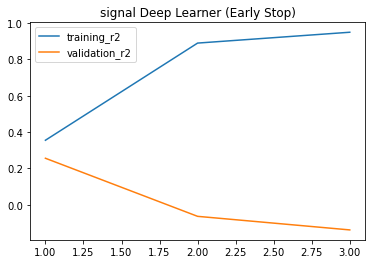

In [32]:
plt.plot(v2_df['training_r2'], label="training_r2")
plt.plot(v2_df['validation_r2'], label="validation_r2")
plt.title("signal Deep Learner (Early Stop)")
plt.legend()

In [33]:
tuned = H2ODeepLearningEstimator(
  model_id="tuned",
  overwrite_with_best_model=False,
  hidden=[50,50,50],           
  epochs=5,                       
  score_validation_samples=250,  
  score_duty_cycle=0.025,          
  adaptive_rate=False,             
  rate=0.01, 
  rate_annealing=0.000002,            
  momentum_start=0.2,              
  momentum_stable=0.4, 
  momentum_ramp=5000, 
  l1=0.00001,                      
  l2=0.00001,
  max_w2=10.
)
tuned.train(X, y, training_frame=train, validation_frame=valid)

deeplearning Model Build progress: |█████████████████████████████████████████████| (done) 100%
Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  tuned


Status of Neuron Layers: predicting Signal_Strength, regression, gaussian distribution, Quadratic loss, 5,751 weights/biases, 52.1 KB, 5,245 training samples, mini-batch size 1


,,layer,units,type,dropout,l1,l2,mean_rate,rate_rms,momentum,mean_weight,weight_rms,mean_bias,bias_rms
0,,1,11,Input,0,,,,,,,,,
1,,2,50,Rectifier,0,1e-05,1e-05,0.00989619,0,0.4,0.0408998,0.822639,-1.49183,1.70245
2,,3,50,Rectifier,0,1e-05,1e-05,0.00989619,0,0.4,-0.154279,0.260032,0.795017,0.355901
3,,4,50,Rectifier,0,1e-05,1e-05,0.00989619,0,0.4,-0.108023,0.197461,0.888373,0.196826
4,,5,1,Linear,,1e-05,1e-05,0.00989619,0,0.4,0.0870602,0.425388,-0.25393,1.09713e-154




ModelMetricsRegression: deeplearning
** Reported on train data. **

MSE: 0.5131064118825719
RMSE: 0.7163144643817908
MAE: 0.6086917210679421
RMSLE: 0.10882565151494543
Mean Residual Deviance: 0.5131064118825719

ModelMetricsRegression: deeplearning
** Reported on validation data. **

MSE: 0.5964187450402372
RMSE: 0.7722815192921796
MAE: 0.6417462935063003
RMSLE: 0.11965827573185213
Mean Residual Deviance: 0.5964187450402372

Scoring History: 


,,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_deviance,training_mae,training_r2,validation_rmse,validation_deviance,validation_mae,validation_r2
0,,2022-02-24 19:38:03,0.000 sec,None,0.000000,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,,2022-02-24 19:38:03,0.026 sec,67000 obs/sec,0.485005,1,469.0,0.798214,0.637146,0.661143,-0.023118,0.841390,0.707937,0.697953,-0.044652
2,,2022-02-24 19:38:03,0.058 sec,149857 obs/sec,5.423992,11,5245.0,0.716314,0.513106,0.608692,0.176063,0.772282,0.596419,0.641746,0.119908



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Parameter 3,1.000000,1.000000,0.132001
1,Parameter 6,0.945802,0.945802,0.124846
2,Parameter 2,0.852480,0.852480,0.112528
3,Parameter 10,0.838774,0.838774,0.110719
4,Parameter 1,0.816167,0.816167,0.107735
5,Parameter 9,0.794921,0.794921,0.104930
6,Parameter 11,0.724001,0.724001,0.095569
7,Parameter 8,0.527884,0.527884,0.069681
8,Parameter 4,0.468901,0.468901,0.061895
9,Parameter 5,0.429278,0.429278,0.056665


In [34]:
tuned_df = tuned.scoring_history()
tuned_df

,,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_deviance,training_mae,training_r2,validation_rmse,validation_deviance,validation_mae,validation_r2
0,,2022-02-24 19:38:03,0.000 sec,None,0.000000,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,,2022-02-24 19:38:03,0.026 sec,67000 obs/sec,0.485005,1,469.0,0.798214,0.637146,0.661143,-0.023118,0.841390,0.707937,0.697953,-0.044652
2,,2022-02-24 19:38:03,0.058 sec,149857 obs/sec,5.423992,11,5245.0,0.716314,0.513106,0.608692,0.176063,0.772282,0.596419,0.641746,0.119908


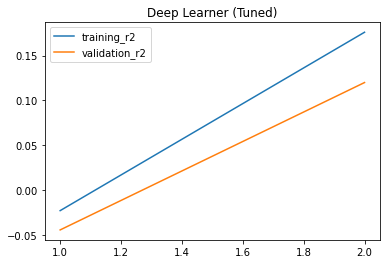

In [35]:
plt.plot(tuned_df['training_r2'], label="training_r2")
plt.plot(tuned_df['validation_r2'], label="validation_r2")
plt.title("Deep Learner (Tuned)")
plt.legend()

In [47]:
pred = tuned.predict(test[0:-1]).as_data_frame(use_pandas=True)
test_actual = test.as_data_frame(use_pandas=True)['Signal_Strength']
(test_actual == pred['predict']).mean()

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


0.0

#Using sklearn and Keras

In [36]:
import sklearn
from sklearn.model_selection import train_test_split
X=signal1.drop('Signal_Strength',axis=1)  
Y=signal1['Signal_Strength']               
X_Train,X_Test,Y_Train,Y_Test=train_test_split(X, Y, train_size=0.7, random_state=12)

In [37]:
from sklearn.preprocessing import StandardScaler
X_Train_S = StandardScaler().fit_transform(X_Train)   
X_Test_S = StandardScaler().fit_transform(X_Test)

In [38]:
print(X_Train_S.shape)
print(X_Test_S.shape)
print(Y_Train.shape)
print(Y_Test.shape)

(1119, 11)
(480, 11)
(1119,)
(480,)


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 120)               1440      
_________________________________________________________________
dense_1 (Dense)              (None, 60)                7260      
_________________________________________________________________
dense_2 (Dense)              (None, 30)                1830      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 30)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 12)                372       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 12)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 1

6/6 [==============================] - 0s 17ms/step - loss: 0.5620 - accuracy: 0.0000e+00 - val_loss: 0.5722 - val_accuracy: 0.0000e+00
Epoch 47/350
6/6 [==============================] - 0s 14ms/step - loss: 0.5556 - accuracy: 0.0000e+00 - val_loss: 0.5676 - val_accuracy: 0.0000e+00
Epoch 48/350
6/6 [==============================] - 0s 15ms/step - loss: 0.5577 - accuracy: 0.0000e+00 - val_loss: 0.5667 - val_accuracy: 0.0000e+00
Epoch 49/350
6/6 [==============================] - 0s 16ms/step - loss: 0.5583 - accuracy: 0.0000e+00 - val_loss: 0.5579 - val_accuracy: 0.0000e+00
Epoch 50/350
6/6 [==============================] - 0s 18ms/step - loss: 0.5520 - accuracy: 0.0000e+00 - val_loss: 0.5513 - val_accuracy: 0.0000e+00
Epoch 51/350
6/6 [==============================] - 0s 16ms/step - loss: 0.5439 - accuracy: 0.0000e+00 - val_loss: 0.5499 - val_accuracy: 0.0000e+00
Epoch 52/350
6/6 [==============================] - 0s 16ms/step - loss: 0.5395 - accuracy: 0.0000e+00 - val_loss: 0.54

6/6 [==============================] - 0s 9ms/step - loss: 0.4824 - accuracy: 0.0000e+00 - val_loss: 0.4782 - val_accuracy: 0.0000e+00
Epoch 102/350
6/6 [==============================] - 0s 10ms/step - loss: 0.4828 - accuracy: 0.0000e+00 - val_loss: 0.4866 - val_accuracy: 0.0000e+00
Epoch 103/350
6/6 [==============================] - 0s 11ms/step - loss: 0.4819 - accuracy: 0.0000e+00 - val_loss: 0.4770 - val_accuracy: 0.0000e+00
Epoch 104/350
6/6 [==============================] - 0s 10ms/step - loss: 0.4811 - accuracy: 0.0000e+00 - val_loss: 0.4765 - val_accuracy: 0.0000e+00
Epoch 105/350
6/6 [==============================] - 0s 12ms/step - loss: 0.4784 - accuracy: 0.0000e+00 - val_loss: 0.4833 - val_accuracy: 0.0000e+00
Epoch 106/350
6/6 [==============================] - 0s 17ms/step - loss: 0.4838 - accuracy: 0.0000e+00 - val_loss: 0.4881 - val_accuracy: 0.0000e+00
Epoch 107/350
6/6 [==============================] - 0s 14ms/step - loss: 0.4805 - accuracy: 0.0000e+00 - val_loss:

Epoch 156/350
6/6 [==============================] - 0s 8ms/step - loss: 0.4737 - accuracy: 0.0000e+00 - val_loss: 0.4654 - val_accuracy: 0.0000e+00
Epoch 157/350
6/6 [==============================] - 0s 7ms/step - loss: 0.4712 - accuracy: 0.0000e+00 - val_loss: 0.4778 - val_accuracy: 0.0000e+00
Epoch 158/350
6/6 [==============================] - 0s 8ms/step - loss: 0.4754 - accuracy: 0.0000e+00 - val_loss: 0.4919 - val_accuracy: 0.0000e+00
Epoch 159/350
6/6 [==============================] - 0s 7ms/step - loss: 0.4709 - accuracy: 0.0000e+00 - val_loss: 0.4641 - val_accuracy: 0.0000e+00
Epoch 160/350
6/6 [==============================] - 0s 8ms/step - loss: 0.4619 - accuracy: 0.0000e+00 - val_loss: 0.4679 - val_accuracy: 0.0000e+00
Epoch 161/350
6/6 [==============================] - 0s 7ms/step - loss: 0.4638 - accuracy: 0.0000e+00 - val_loss: 0.4784 - val_accuracy: 0.0000e+00
Epoch 162/350
6/6 [==============================] - 0s 6ms/step - loss: 0.4581 - accuracy: 0.0000e+00 - v

6/6 [==============================] - 0s 10ms/step - loss: 0.4400 - accuracy: 0.0000e+00 - val_loss: 0.4600 - val_accuracy: 0.0000e+00
Epoch 211/350
6/6 [==============================] - 0s 11ms/step - loss: 0.4407 - accuracy: 0.0000e+00 - val_loss: 0.4643 - val_accuracy: 0.0000e+00
Epoch 212/350
6/6 [==============================] - 0s 12ms/step - loss: 0.4386 - accuracy: 0.0000e+00 - val_loss: 0.4621 - val_accuracy: 0.0000e+00
Epoch 213/350
6/6 [==============================] - 0s 13ms/step - loss: 0.4413 - accuracy: 0.0000e+00 - val_loss: 0.4641 - val_accuracy: 0.0000e+00
Epoch 214/350
6/6 [==============================] - 0s 17ms/step - loss: 0.4422 - accuracy: 0.0000e+00 - val_loss: 0.4716 - val_accuracy: 0.0000e+00
Epoch 215/350
6/6 [==============================] - 0s 16ms/step - loss: 0.4412 - accuracy: 0.0000e+00 - val_loss: 0.4606 - val_accuracy: 0.0000e+00
Epoch 216/350
6/6 [==============================] - 0s 15ms/step - loss: 0.4365 - accuracy: 0.0000e+00 - val_loss

Epoch 265/350
6/6 [==============================] - 0s 13ms/step - loss: 0.4190 - accuracy: 0.0000e+00 - val_loss: 0.4667 - val_accuracy: 0.0000e+00
Epoch 266/350
6/6 [==============================] - 0s 15ms/step - loss: 0.4201 - accuracy: 0.0000e+00 - val_loss: 0.4754 - val_accuracy: 0.0000e+00
Epoch 267/350
6/6 [==============================] - 0s 16ms/step - loss: 0.4243 - accuracy: 0.0000e+00 - val_loss: 0.4716 - val_accuracy: 0.0000e+00
Epoch 268/350
6/6 [==============================] - 0s 16ms/step - loss: 0.4305 - accuracy: 0.0000e+00 - val_loss: 0.4651 - val_accuracy: 0.0000e+00
Epoch 269/350
6/6 [==============================] - 0s 16ms/step - loss: 0.4308 - accuracy: 0.0000e+00 - val_loss: 0.4664 - val_accuracy: 0.0000e+00
Epoch 270/350
6/6 [==============================] - 0s 15ms/step - loss: 0.4256 - accuracy: 0.0000e+00 - val_loss: 0.4651 - val_accuracy: 0.0000e+00
Epoch 271/350
6/6 [==============================] - 0s 15ms/step - loss: 0.4210 - accuracy: 0.0000e

Epoch 320/350
6/6 [==============================] - 0s 6ms/step - loss: 0.4085 - accuracy: 0.0000e+00 - val_loss: 0.4743 - val_accuracy: 0.0000e+00
Epoch 321/350
6/6 [==============================] - 0s 8ms/step - loss: 0.3998 - accuracy: 0.0000e+00 - val_loss: 0.4750 - val_accuracy: 0.0000e+00
Epoch 322/350
6/6 [==============================] - 0s 12ms/step - loss: 0.4022 - accuracy: 0.0000e+00 - val_loss: 0.4682 - val_accuracy: 0.0000e+00
Epoch 323/350
6/6 [==============================] - 0s 6ms/step - loss: 0.3985 - accuracy: 0.0000e+00 - val_loss: 0.4646 - val_accuracy: 0.0000e+00
Epoch 324/350
6/6 [==============================] - 0s 8ms/step - loss: 0.3939 - accuracy: 0.0000e+00 - val_loss: 0.4668 - val_accuracy: 0.0000e+00
Epoch 325/350
6/6 [==============================] - 0s 8ms/step - loss: 0.3951 - accuracy: 0.0000e+00 - val_loss: 0.4636 - val_accuracy: 0.0000e+00
Epoch 326/350
6/6 [==============================] - 0s 11ms/step - loss: 0.3970 - accuracy: 0.0000e+00 -

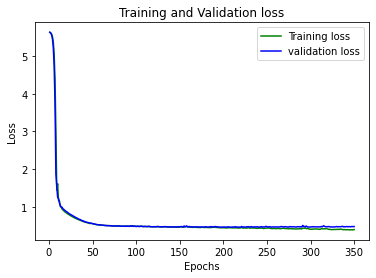

In [39]:
from keras.models import Sequential
from keras.layers import Dense, Activation, LeakyReLU
from keras import optimizers
NN_model_Regressor = Sequential()

NN_model_Regressor.add(Dense(120, kernel_initializer='normal',input_dim = X_Train.shape[1], activation='relu'))

NN_model_Regressor.add(Dense(60, kernel_initializer='normal',activation='relu'))  # sigmoid, tanh

NN_model_Regressor.add(Dense(30, kernel_initializer='normal'))
NN_model_Regressor.add(LeakyReLU(alpha=0.1))

NN_model_Regressor.add(Dense(12, kernel_initializer='normal'))
NN_model_Regressor.add(LeakyReLU(alpha=0.1))

NN_model_Regressor.add(Dense(1, kernel_initializer='normal'))  # except softmax
NN_model_Regressor.add(LeakyReLU(alpha=0.1))

NN_model_Regressor.compile(loss='mean_absolute_error', optimizer='adam', metrics=['accuracy'])
NN_model_Regressor.summary()

EPOCH=350
Network_Regressor=NN_model_Regressor.fit(X_Train_S, Y_Train, validation_data=(X_Test_S,Y_Test), epochs=EPOCH, batch_size=190)

loss_train = Network_Regressor.history['loss']
loss_val = Network_Regressor.history['val_loss']
epochs = range(1,EPOCH+1)
plt.plot(epochs, loss_train, 'g', label='Training loss')
plt.plot(epochs, loss_val, 'b', label='validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

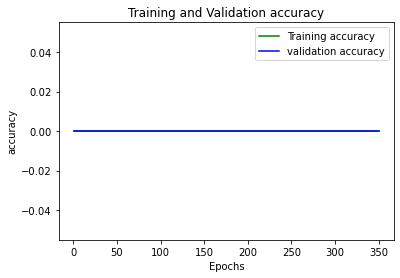

In [45]:
Acc_train = Network_Regressor.history['accuracy']
Acc_val = Network_Regressor.history['val_accuracy']
epochs = range(1,EPOCH+1)
plt.plot(epochs, Acc_train, 'g', label='Training accuracy')
plt.plot(epochs, Acc_val, 'b', label='validation accuracy')
plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

#Model for future use

In [42]:
from keras.models import model_from_json
import numpy
import os

Regressor_model_json = NN_model_Regressor.to_json()
with open("Regressor_model.json", "w") as json_file:
    json_file.write(Regressor_model_json)
NN_model_Regressor.save_weights("Regressor_model.h5")
print("Saved model to disk")
json_file = open('Regressor_model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
loaded_model.load_weights("Regressor_model.h5")
print("Loaded model from disk")
loaded_model.compile(loss='binary_crossentropy', optimizer='rmsprop', metrics=['accuracy'])
score = loaded_model.evaluate(X_Test_S,Y_Test, verbose=0)
print("%s: %.2f%%" % (loaded_model.metrics_names[1], score[1]*100))

Saved model to disk
Loaded model from disk
accuracy: 0.00%


#Using GUI AutoML

In [52]:
signal2 = signal1.drop(columns = ['Signal_Strength'], axis = 1)

In [53]:
import warnings
warnings.filterwarnings('ignore')
from luciferml.supervised.classification import Classification
X = signal2 
y = signal1["Signal_Strength"]
classifier = Classification(
    predictor='all', 
    params= {},
    cv_folds=2, 
    epochs=5)
classifier.fit(X, y)


          
██╗░░░░░██╗░░░██╗░█████╗░██╗███████╗███████╗██████╗░░░░░░░███╗░░░███╗██╗░░░░░
██║░░░░░██║░░░██║██╔══██╗██║██╔════╝██╔════╝██╔══██╗░░░░░░████╗░████║██║░░░░░
██║░░░░░██║░░░██║██║░░╚═╝██║█████╗░░█████╗░░██████╔╝█████╗██╔████╔██║██║░░░░░
██║░░░░░██║░░░██║██║░░██╗██║██╔══╝░░██╔══╝░░██╔══██╗╚════╝██║╚██╔╝██║██║░░░░░
███████╗╚██████╔╝╚█████╔╝██║██║░░░░░███████╗██║░░██║░░░░░░██║░╚═╝░██║███████╗
╚══════╝░╚═════╝░░╚════╝░╚═╝╚═╝░░░░░╚══════╝╚═╝░░╚═╝░░░░░░╚═╝░░░░░╚═╝╚══════╝

Started LuciferML 

Checking if labels or features are categorical! [*]

Features are not categorical [ ✓ ]

Labels are not categorical [ ✓ ]

Checking for Categorical Variables Done [ ✓ ]

Checking for Sparse Matrix [*]

Splitting Data into Train and Validation Sets [*]

Splitting Done [ ✓ ]

Scaling Training and Test Sets [*]

Scaling Done [ ✓ ]

Training All Classifiers [*]
[19:56:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "verbose" } might not b

,Accuracy,KFold Accuracy
Logistic Regression,56.5625,58.562940
Stochastic Gradient Descent,52.1875,52.464666
Perceptron,43.4375,42.378961
Passive Aggressive Classifier,42.5000,50.665591
Ridge Classifier,56.2500,56.216989
Support Vector Machine,59.3750,60.048660
K-Nearest Neighbours,56.2500,53.871772
Decision Trees,58.4375,54.495427
Naive Bayes,51.8750,55.200142
Random Forest Classifier,64.6875,64.191608


Complete [ ✓ ]

Time Elapsed :  48.63092541694641 seconds 



I tried three different methods the accuracy score was zero for ANN. 

# Part-2

#Importing data

In [55]:
import h5py
import numpy as np

In [56]:
Auto = h5py.File('C:\\Users\\Admin\\Desktop\\ANN\\Part - 4 - Autonomous_Vehicles_SVHN_single_grey1.h5', 'r')

In [61]:
Auto.keys()

<KeysViewHDF5 ['X_test', 'X_train', 'X_val', 'y_test', 'y_train', 'y_val']>

In [62]:
X_train = Auto['X_train'][:]
y_train = Auto['y_train'][:]
X_test = Auto['X_test'][:]
y_test = Auto['y_test'][:]

#Data pre-processing & visualisation

In [73]:
X_train[:1]

array([[[0.12968785],
        [0.11866706],
        [0.10530196],
        ...,
        [0.19477727],
        [0.19942354],
        [0.20799099]]], dtype=float32)

In [74]:
y_train[:1]

array([[0., 0., 1., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [75]:
X_test[:1]

array([[[0.15905097],
        [0.18349686],
        [0.19206432],
        ...,
        [0.43143883],
        [0.4360851 ],
        [0.44780627]]], dtype=float32)

In [76]:
y_test[:1]

array([[0., 1., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

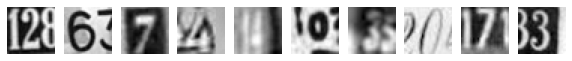

label for each of the above image: [2 6 7 4 4 0 3 0 7 3]


In [63]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 1))
for i in range(10):
    plt.subplot(1, 10, i+1)
    plt.imshow(X_train[i], cmap="gray")
    plt.axis('off')
plt.show()
print('label for each of the above image: %s' % (y_train[0:10]))

In [64]:
X_train.shape

(42000, 32, 32)

In [65]:
y_train.shape

(42000,)

In [66]:
X_train = X_train.reshape(X_train.shape[0], 1024, 1)
X_test = X_test.reshape(X_test.shape[0], 1024, 1)
X_train = X_train / 255.0
X_test = X_test / 255.0
print('Resized Training set', X_train.shape, y_train.shape)
print('Resized Test set', X_test.shape, y_test.shape)

Resized Training set (42000, 1024, 1) (42000,)
Resized Test set (18000, 1024, 1) (18000,)


In [67]:
from tensorflow.keras.utils import to_categorical
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)
num_classes = y_test.shape[1] 
print("The number of classes in this dataset are:",num_classes)

The number of classes in this dataset are: 10


#Designing, training, tuning and testing a neural network image classifier.

In [68]:
from tensorflow.keras import optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
def nn_model():
    model = Sequential()  
    model.add(Flatten())
    model.add(Dense(256, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))
    return model

In [69]:
model = nn_model()
sgd = optimizers.Adam(lr=1e-3)
model.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])

In [70]:
training_history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=100, batch_size=300, verbose=2)

Epoch 1/100
140/140 - 4s - loss: 2.2924 - accuracy: 0.1171 - val_loss: 2.2065 - val_accuracy: 0.1562
Epoch 2/100
140/140 - 2s - loss: 2.0289 - accuracy: 0.2300 - val_loss: 1.8348 - val_accuracy: 0.3353
Epoch 3/100
140/140 - 5s - loss: 1.6526 - accuracy: 0.4343 - val_loss: 1.5266 - val_accuracy: 0.4851
Epoch 4/100
140/140 - 2s - loss: 1.4058 - accuracy: 0.5455 - val_loss: 1.3049 - val_accuracy: 0.5828
Epoch 5/100
140/140 - 2s - loss: 1.2941 - accuracy: 0.5845 - val_loss: 1.2276 - val_accuracy: 0.6129
Epoch 6/100
140/140 - 2s - loss: 1.2118 - accuracy: 0.6166 - val_loss: 1.1884 - val_accuracy: 0.6264
Epoch 7/100
140/140 - 2s - loss: 1.1597 - accuracy: 0.6363 - val_loss: 1.1227 - val_accuracy: 0.6517
Epoch 8/100
140/140 - 2s - loss: 1.1205 - accuracy: 0.6488 - val_loss: 1.1013 - val_accuracy: 0.6564
Epoch 9/100
140/140 - 2s - loss: 1.0850 - accuracy: 0.6625 - val_loss: 1.0853 - val_accuracy: 0.6614
Epoch 10/100
140/140 - 2s - loss: 1.0464 - accuracy: 0.6758 - val_loss: 1.0511 - val_accura

Epoch 82/100
140/140 - 2s - loss: 0.4784 - accuracy: 0.8487 - val_loss: 0.6826 - val_accuracy: 0.8058
Epoch 83/100
140/140 - 2s - loss: 0.4714 - accuracy: 0.8512 - val_loss: 0.6692 - val_accuracy: 0.8069
Epoch 84/100
140/140 - 2s - loss: 0.4654 - accuracy: 0.8531 - val_loss: 0.6808 - val_accuracy: 0.8098
Epoch 85/100
140/140 - 2s - loss: 0.4573 - accuracy: 0.8567 - val_loss: 0.6760 - val_accuracy: 0.8063
Epoch 86/100
140/140 - 2s - loss: 0.4637 - accuracy: 0.8538 - val_loss: 0.6727 - val_accuracy: 0.8095
Epoch 87/100
140/140 - 2s - loss: 0.4685 - accuracy: 0.8527 - val_loss: 0.6705 - val_accuracy: 0.8111
Epoch 88/100
140/140 - 2s - loss: 0.4535 - accuracy: 0.8581 - val_loss: 0.6660 - val_accuracy: 0.8098
Epoch 89/100
140/140 - 2s - loss: 0.4633 - accuracy: 0.8553 - val_loss: 0.6791 - val_accuracy: 0.8113
Epoch 90/100
140/140 - 2s - loss: 0.4544 - accuracy: 0.8575 - val_loss: 0.6805 - val_accuracy: 0.8093
Epoch 91/100
140/140 - 2s - loss: 0.4567 - accuracy: 0.8570 - val_loss: 0.6945 - v

In [71]:
scores = model.evaluate(X_test, y_test, verbose=0)
print("Loss:", scores[0])
print("Accuracy:", scores[1])

Loss: 0.7012929916381836
Accuracy: 0.8041666746139526


#Plot

Text(0.5, 1.0, 'Training and validation loss')

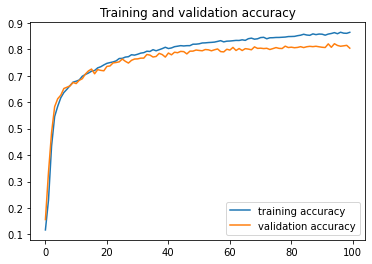

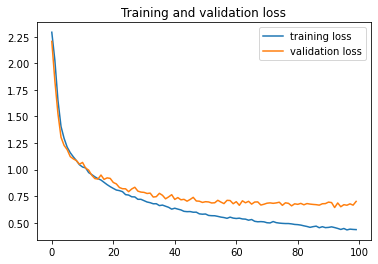

In [72]:
accuracy      = training_history.history['accuracy']
val_accuracy  = training_history.history['val_accuracy']
loss     = training_history.history['loss']
val_loss = training_history.history['val_loss']

epochs   = range(len(accuracy))

plt.plot  ( epochs, accuracy, label = 'training accuracy' )
plt.plot  ( epochs, val_accuracy, label = 'validation accuracy' )
plt.title ('Training and validation accuracy')
plt.legend(loc = 'lower right')
plt.figure()

plt.plot  ( epochs, loss, label = 'training loss' )
plt.plot  ( epochs, val_loss, label = 'validation loss' )
plt.legend(loc = 'upper right')
plt.title ('Training and validation loss')